In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar la imagen
img = cv2.imread('Escena_01.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Detectar puntos clave y calcular descriptores
keypoints, descriptors = sift.detectAndCompute(gray, None)

# Dibujar los puntos clave en la imagen
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Mostrar la imagen con puntos clave
plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con SIFT')
plt.show()


[ WARN:0@0.238] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('Escena_01.png'): can't open/read file: check file path/integrity


error: OpenCV(4.6.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [1]:
import cv2

# Crear el objeto SIFT con parámetros personalizados
sift = cv2.SIFT_create(
    nfeatures=500,        # Número de características a retener
    nOctaveLayers=3,      # Número de capas por octava
    contrastThreshold=0.04, # Umbral de contraste
    edgeThreshold=10,     # Umbral de borde
    sigma=1.6             # Sigma de la Gaussian utilizada para la detección de escala
)

# Cargar la imagen y convertirla a escala de grises
img = cv2.imread('Escena_01.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detectar puntos clave y calcular descriptores
keypoints, descriptors = sift.detectAndCompute(gray, None)

# Dibujar los puntos clave en la imagen
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Mostrar la imagen con puntos clave
cv2.imshow('Puntos Clave Detectados con SIFT', img_with_keypoints)
cv2.waitKey(0)
cv2.destroyAllWindows()


12685


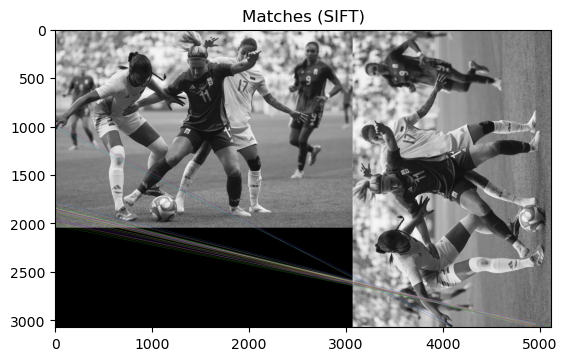

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar las imágenes
img1 = cv2.imread('Escena_01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena A
#img2 = cv2.imread('Escena_01_rotada_10_grados.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena B
img2 = cv2.imread('Escena_01_rotada_90_grados.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena B
#img2 = cv2.imread('Escena_01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena B

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True) #En general estos parámetros son buenos para SIFT
                                                  
matches = bf.match(descriptors1, descriptors2)

# Ordenar los matches por distancia
matches = sorted(matches, key=lambda x: x.distance)
print(len(matches))
# Dibujar los primeros 10 matches
img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrar la imagen con los matches
#cv2.imshow('Matches (SIFT)', img_matches)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('Matches (SIFT)')
plt.show()



13469


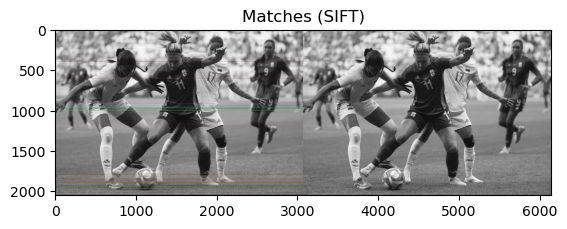

In [8]:
import cv2
import numpy as np

# Cargar las imágenes
img1 = cv2.imread('Escena_01.png', cv2.IMREAD_GRAYSCALE)  # Imagen del objeto
img2 = cv2.imread('Escena_01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True) #En general estos parámetros son buenos para SIFT
                                                  
matches = bf.match(descriptors1, descriptors2)

# Ordenar los matches por distancia
matches = sorted(matches, key=lambda x: x.distance)
print(len(matches))

# Dibujar los primeros 10 matches
img_matches = cv2.drawMatches(img1, keypoints1,
                              img2, keypoints2,
                              matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrar la imagen con los matches
#cv2.imshow('Matches', img_matches)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('Matches (SIFT)')
plt.show()




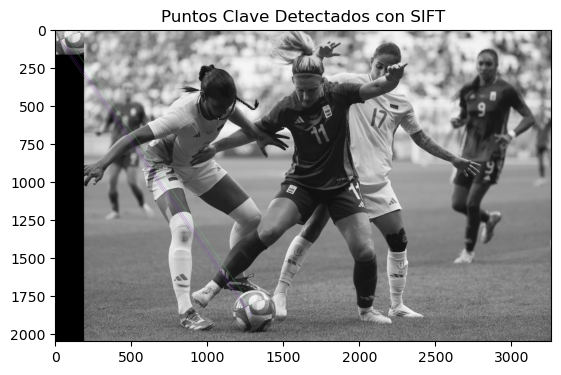

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar las imágenes
img1 = cv2.imread('Objeto_01.png', cv2.IMREAD_GRAYSCALE)  # Imagen del objeto
img2 = cv2.imread('Escena_02.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena

# Crear el objeto SIFT
#sift = cv2.SIFT_create()

# Crear el objeto SIFT con parámetros personalizados
sift = cv2.SIFT_create(
    nfeatures=1000,        # Número de características a retener
    nOctaveLayers=8,      # Número de capas por octava
    contrastThreshold=0.01, # Umbral de contraste
    edgeThreshold=5,     # Umbral de borde
    sigma=5.0             # Sigma de la Gaussian utilizada para la detección de escala
)

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)

# Ordenar los matches por distancia
matches = sorted(matches, key=lambda x: x.distance)

# Dibujar los primeros 10 matches
img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:5], 
                              None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrar la imagen con puntos clave
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con SIFT')
plt.show()



x: 283 y: 1483 size: 1
x: 187 y: 1001 size: 2
x: 543 y: 1800 size: 1
x: 1902 y: 271 size: 1
x: 1886 y: 1632 size: 1
x: 1855 y: 272 size: 5
x: 565 y: 1789 size: 2
x: 1040 y: 264 size: 1
x: 1043 y: 1649 size: 1
x: 548 y: 1798 size: 1


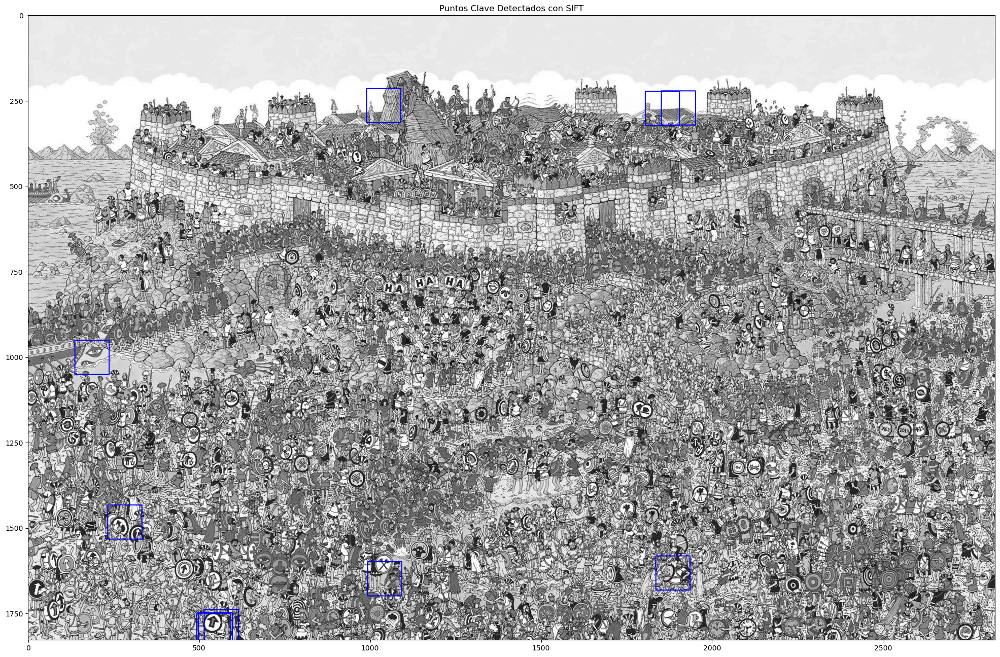

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar las imágenes
img1 = cv2.imread('wally.png', cv2.IMREAD_GRAYSCALE)  # Imagen del objeto
img2 = cv2.imread('escenario01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)

# Ordenar los matches por distancia
matches = sorted(matches, key=lambda x: x.distance)

# Dibujar los primeros 10 matches
#img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:15], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:5], None, flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Dibujar cuadrados en la segunda imagen centrados en las coordenadas de los mejores matches
img_with_squares = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)  # Convertir a BGR para dibujar en color
for match in matches[:10]:  # Dibujar cuadrados para los primeros 10 matches
    kp = keypoints2[match.trainIdx]
    x, y = int(kp.pt[0]), int(kp.pt[1])    
    size = int(kp.size)
    
    print("x:", x, "y:", y, "tamano:", size)

    size = 100
    top_left = (x - size // 2, y - size // 2)
    bottom_right = (x + size // 2, y + size // 2)
    cv2.rectangle(img_with_squares, top_left, bottom_right, (255, 0, 0), 2)

# Mostrar la imagen con puntos clave
fig, ax = plt.subplots(figsize=(144, 16))
ax.imshow(cv2.cvtColor(img_with_squares, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con SIFT')
plt.show()


x: 283 y: 1483 size: 1
x: 187 y: 1001 size: 2
x: 543 y: 1800 size: 1
x: 1902 y: 271 size: 1
x: 1886 y: 1632 size: 1
x: 1855 y: 272 size: 5
x: 565 y: 1789 size: 2
x: 1040 y: 264 size: 1
x: 1043 y: 1649 size: 1
x: 548 y: 1798 size: 1


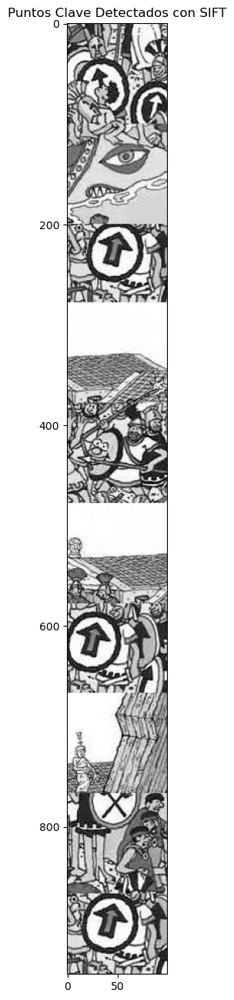

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar las imágenes
img1 = cv2.imread('wally.png', cv2.IMREAD_GRAYSCALE)  # Imagen del objeto
img2 = cv2.imread('escenario01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena

# Crear el objeto SIFT
sift = cv2.SIFT_create()
#sift = cv2.xfeatures2d.SURF_create(hessianThreshold=400)

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(descriptors1, descriptors2)

# Ordenar los matches por distancia
matches = sorted(matches, key=lambda x: x.distance)

# Dibujar los primeros 10 matches
#img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:15], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#img_matches = cv2.drawMatches(img1, keypoints1, img2, keypoints2, matches[:5], None, flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Dibujar cuadrados en la segunda imagen centrados en las coordenadas de los mejores matches
#img_with_squares = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)  # Convertir a BGR para dibujar en color
#img_with_squares = np.zeros_like(img2)
recortes = []
for match in matches[:10]:  # Dibujar cuadrados para los primeros 10 matches
    kp = keypoints2[match.trainIdx]
    x, y = int(kp.pt[0]), int(kp.pt[1])    
    
    size = int(kp.size)
    
    print("x:", x, "y:", y, "size:", size)

    size = 100
    top_left_x = max(0, x - size // 2)
    top_left_y = max(0, y - size // 2)
    bottom_right_x = min(img2.shape[1], x + size // 2)
    bottom_right_y = min(img2.shape[0], y + size // 2)
    recorte = img2[top_left_y:bottom_right_y, top_left_x:bottom_right_x]
    recortes.append(recorte)

# Crear una imagen en blanco para colocar los recortes
altura_total = sum([recorte.shape[0] for recorte in recortes])
ancho_maximo = max([recorte.shape[1] for recorte in recortes])

# Colocar los recortes en la imagen final
y_offset = 0
for recorte in recortes:
    img_final[y_offset:y_offset + recorte.shape[0], :recorte.shape[1]] = recorte
    y_offset += recorte.shape[0]

# Mostrar la imagen con puntos clave
fig, ax = plt.subplots(figsize=(144, 16))
ax.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con SIFT')
plt.show()




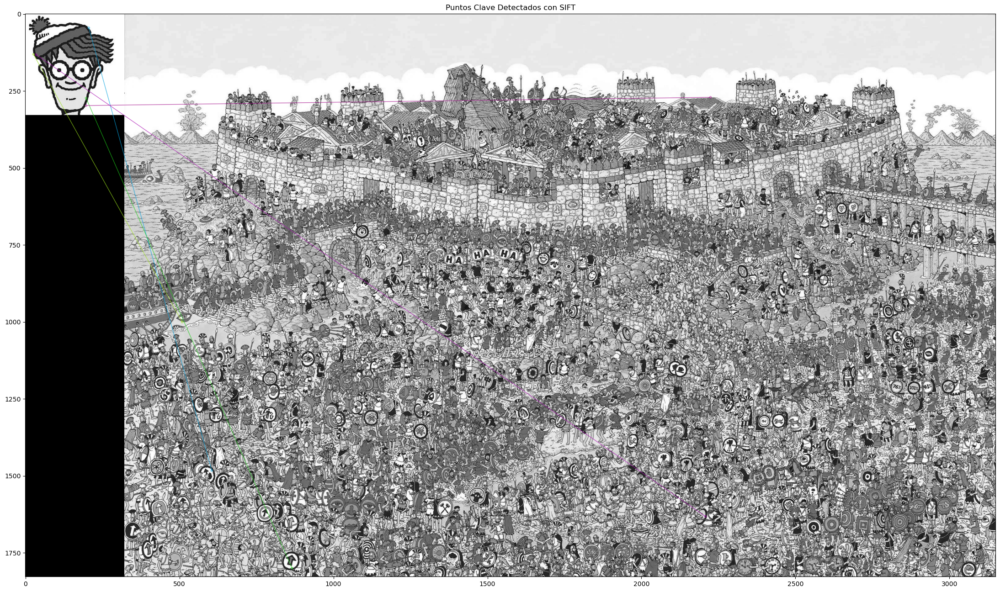

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar las imágenes
img1 = cv2.imread('wally.png', cv2.IMREAD_GRAYSCALE)  # Imagen del objeto
img2 = cv2.imread('escenario01.png', cv2.IMREAD_GRAYSCALE)  # Imagen de la escena

# Crear el objeto SIFT
sift = cv2.SIFT_create()

# Detectar puntos clave y calcular descriptores
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

# Usar BFMatcher para encontrar los mejores matches
bf = cv2.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

# Dibujar los primeros 10 matches
#img3 = cv2.drawMatchesKnn(img1,keypoints1,img2,keypoints2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img3 = cv2.drawMatchesKnn(img1,keypoints1,img2,keypoints2,good,None,flags=cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)

# Mostrar la imagen con puntos clave
fig, ax = plt.subplots(figsize=(144, 16))
ax.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('Puntos Clave Detectados con SIFT')
plt.show()


